
--------------------------------------------------------------------
--------------------------------------------------------------------
# Classification des Maladies des Plantes avec les CNN (Deep Learning)

***By ALOTSE Christy***

-------------------------------------------------------------------
-------------------------------------------------------------------



# Compréhension du problème



**Contexte & problématique:** Selon l'Organisation des Nations Unies pour l'alimentation et l'agriculture (FAO), jusqu'à 40 % des cultures vivrières mondiales sont perdues chaque année à cause des maladies et des ravageurs des plantes, entraînant des pertes économiques estimées à environ 220 milliards de dollars par an . Les maladies des plantes entraînent non seulement une diminution des rendements, mais aussi une baisse de la qualité des produits agricoles, une augmentation des coûts de production (notamment en intrants et en main-d'œuvre) et une réduction des revenus des agriculteurs .


**Solution:** Pour atténuer ces impacts, nous allons mettre en place un modèle de machine adapté de reconnaissance visuelle des maladies des plantes. Avec les avancées technologiques, ce modèle sera joint à une application mobile et permettra ainsi de diagnostics et de télédétection des mobiles de maladies et pour surveiller la santé des plantes .​



**Références :**



*   Annnée Internationale de la Santé des Végétaux : https://www.fao.org/plant-health-2020/about/fr/
*   MDPI : https://www.mdpi.com/2073-4395/14/8

*   WIKIPEDIA






# Description du dataset utilisé

Le jeu de données que nous allons utiliser pour entraîner notre modèle est celui du **PlantVillage Dataset**. Il se compose de 38 dossiers, chacun correspondant à une maladie spécifique affectant une variété de plante, ce qui en fait une ressource riche et bien structurée pour l’identification et la classification des maladies végétales.

# Récupération des données sur Kaggle

Étant donné que nos images sont hébergées sur la plateforme Kaggle, nous avons utilisé notre clé d’authentification personnelle pour établir une connexion sécurisée entre Kaggle et l’environnement cloud de Google Colab. Cette clé nous a permis d’autoriser l’accès aux ressources de notre compte Kaggle depuis Colab. Une fois cette connexion établie, nous avons pu télécharger automatiquement le dataset souhaité et créer un dossier local dans l’environnement Colab pour y stocker les images, facilitant ainsi leur traitement et leur utilisation dans nos analyses.

In [ ]:
# Télécharger la clé kaggle

from google.colab import files
files.upload()


In [2]:
# Créer un dossier .kaggle
!mkdir -p ~/.kaggle

# Déplacer kaggle.json dans ce dossier
!mv kaggle.json ~/.kaggle/

# Donner les permissions nécessaires
!chmod 600 ~/.kaggle/kaggle.json


In [3]:
# Télécharger l'archive ZIP du dataset depuis Kaggle

!kaggle datasets download -d abdallahalidev/plantvillage-dataset



Dataset URL: https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset
License(s): CC-BY-NC-SA-4.0


In [4]:
# Décompresser le fichier ZIP dans le répertoire ./data

!unzip -q plantvillage-dataset.zip -d ./data



In [ ]:
!ls ./data

'plantvillage dataset'



# Importons des librairies nécéssaires

In [5]:
# Importation des bibliothèques système
import os
import time
import shutil
import pathlib
import itertools

# Importation des outils de manipulation des données
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
#sns.set_style('darkgrid')  # Option de style pour les graphiques Seaborn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay
from sklearn.utils.class_weight import compute_class_weight

# Importation des bibliothèques de Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax, RMSprop
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LambdaCallback

# Ignorer les avertissements
import warnings
warnings.filterwarnings("ignore")

print('Modules chargés')


Modules chargés


# Explorer la structure du dataset

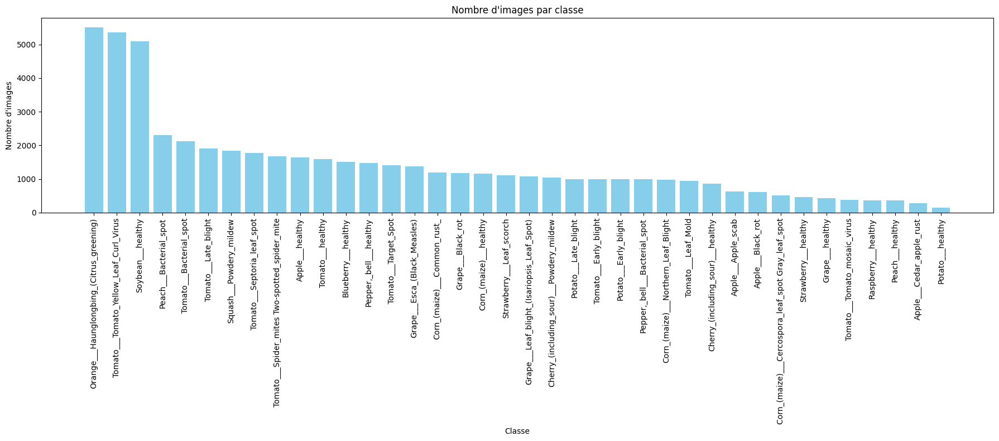

In [6]:

data_bar = './data/plantvillage dataset/color/'

# Récupérer les classes
classes = os.listdir(data_bar)
classes = [cls for cls in classes if os.path.isdir(os.path.join(data_bar, cls))]

# Compter les images par classe
class_counts = {cls: len(os.listdir(os.path.join(data_bar, cls))) for cls in classes}

# Tri par nombre décroissant
class_counts = dict(sorted(class_counts.items(), key=lambda item: item[1], reverse=True))

# Bar chart (distribution)
plt.figure(figsize=(18, 8))  # plus large
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xticks(rotation=90, fontsize=10)  # tourne les labels verticalement
plt.title("Nombre d'images par classe")
plt.xlabel("Classe")
plt.ylabel("Nombre d'images")
plt.tight_layout()
plt.show()



Cette distribution met en évidence un déséquilibre entre les classes, certaines étant largement représentées tandis que d'autres le sont beaucoup moins. Ce déséquilibre pourrait nuire aux performances du modèle, en particulier pour les classes sous-représentées, qui risquent d’être moins bien apprises et donc moins bien reconnues lors de la prédiction.

# Fonction pour la préparation des données pour le modèle & Splittage

Ces fonctions visent à préparer les données image pour l'entraînement d’un modèle de classification en deep learning. Elle commence par parcourir les dossiers du répertoire principal des données, où chaque dossier correspond à une classe (par exemple, une maladie végétale particulière). Pour chaque image, son chemin absolu est enregistré, et une étiquette correspondant au nom du dossier (donc à la classe) lui est attribuée. On obtient ainsi deux listes parallèles : l’une contenant les chemins d’accès des images, et l’autre contenant les étiquettes associées. Ces deux listes sont ensuite combinées dans une structure tabulaire, un DataFrame, qui associe chaque image à sa classe de manière explicite.

Une fois cette structure créée, elle est divisée en trois ensembles distincts : un ensemble d'entraînement (70 % des données), un ensemble de validation et un ensemble de test (chacun représentant 15 % des données restantes). Cette division est effectuée de manière **stratifiée**, c’est-à-dire que la répartition des classes est conservée dans chaque sous-ensemble, ce qui est essentiel pour garantir que le modèle soit évalué de façon équilibrée sur l'ensemble des classes, même en cas de déséquilibre initial.

In [7]:
# Générer les chemins des données avec les étiquettes
def define_paths(data_dir):
    filepaths = []
    labels = []

    folds = os.listdir(data_dir)
    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
            labels.append(fold)

    return filepaths, labels




# Concaténer les chemins des données avec les étiquettes dans un seul DataFrame (pour l'entraînement du modèle plus tard)
def define_df(files, classes):
    Fseries = pd.Series(files, name= 'filepaths')
    Lseries = pd.Series(classes, name='labels')
    return pd.concat([Fseries, Lseries], axis= 1)




# Diviser le DataFrame en ensembles d'entraînement, de validation et de test
def split_data(data_dir):
    # DataFrame d'entraînement
    files, classes = define_paths(data_dir)
    df = define_df(files, classes)
    strat = df['labels']
    train_df, dummy_df = train_test_split(df,  train_size= 0.7, shuffle= True, random_state= 123, stratify= strat)

    # DataFrames de validation et de test
    strat = dummy_df['labels']
    valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= strat)

    return train_df, valid_df, test_df


# Fonction pour le prétraitement des images

Ces différentes fonctions ont pour objectif de transformer les ensembles d’images précédemment préparés (entraînement, validation, test) en **générateurs** compatibles avec un modèle de deep learning. Ces générateurs permettent de charger les images en mémoire par petits lots (batches) et de les prétraiter à la volée. La première étape consiste à normaliser les images, c’est-à-dire à mettre à l’échelle les valeurs des pixels entre 0 et 1, ce qui facilite l’apprentissage du modèle. Ensuite, trois générateurs distincts sont créés à partir des DataFrames contenant les chemins d'accès aux images et leurs étiquettes respectives. Pour chaque générateur, les images sont automatiquement redimensionnées à une taille standard (par exemple 224x224 pixels) afin d’être compatibles avec la structure du modèle. Le générateur d’entraînement mélange aléatoirement les images à chaque époque pour éviter les biais liés à l’ordre des données, tandis que celui de test conserve l’ordre des images pour permettre une évaluation fidèle. Tous les générateurs utilisent un mode de classification multiclasse, ce qui permet d’encoder les étiquettes sous forme de vecteurs catégoriels adaptés à l’apprentissage supervisé. Ces générateurs jouent un rôle clé dans la gestion efficace des données, en permettant d’entraîner et d’évaluer un modèle sans avoir à charger l’ensemble des images en mémoire simultanément.

In [ ]:

# Fonction pour créer les générateurs d'images à partir des DataFrames d'entraînement, validation et test
def create_generators(train_df, valid_df, test_df, target_size=(224, 224), batch_size=40):

    # Normalisation des images (mise à l'échelle des pixels entre 0 et 1)
    datagen = ImageDataGenerator(rescale=1./255)

    # Générateur pour l'ensemble d'entraînement
    train_gen = datagen.flow_from_dataframe(
        train_df,                  # DataFrame contenant les chemins et étiquettes
        x_col='filepaths',         # Colonne contenant les chemins vers les images
        y_col='labels',            # Colonne contenant les étiquettes
        target_size=target_size,   # Taille à laquelle redimensionner les images
        #color_mode=color_mode,    
        class_mode='categorical',  # Mode de classification : ici multiclasse
        shuffle=True,              # Mélange des données pour éviter l'ordre biaisé
        batch_size=batch_size      # Nombre d’images par lot
    )

    # Générateur pour l'ensemble de validation
    val_gen = datagen.flow_from_dataframe(
        valid_df,
        x_col='filepaths',
        y_col='labels',
        target_size=target_size,
        #color_mode=color_mode,
        class_mode='categorical',
        shuffle=True,
        batch_size=batch_size
    )

    # Générateur pour l'ensemble de test (shuffle désactivé pour conserver l’ordre)
    test_gen = datagen.flow_from_dataframe(
        test_df,
        x_col='filepaths',
        y_col='labels',
        target_size=target_size,
        #color_mode=color_mode,
        class_mode='categorical',
        shuffle=False,             # Ne pas mélanger pour pouvoir évaluer précisément
        batch_size=batch_size
    )

    return train_gen, val_gen, test_gen  # Retourne les trois générateurs


# Fonction pour afficher quelques images après traitement

In [ ]:
def show_images(gen):
    '''
    Cette fonction prend le générateur de données et affiche un échantillon des images
    '''

    # retourner les classes, images à afficher
    g_dict = gen.class_indices        # définit un dictionnaire {'classe' : index}
    classes = list(g_dict.keys())     # définit une liste des clés du dictionnaire (les classes), noms des classes : chaîne de caractères
    images, labels = next(gen)        # obtenir un lot d'échantillons depuis le générateur

    # calculer le nombre d’échantillons à afficher
    length = len(labels)        # taille du lot
    sample = min(length, 25)    # vérifier si l'échantillon contient moins de 25 images

    plt.figure(figsize= (20, 20))

    for i in range(sample):
        plt.subplot(5, 5, i + 1)
        image = images[i]       # mise à l'échelle des données entre 0 et 255
        plt.imshow(image)
        index = np.argmax(labels[i])  # obtenir l'index de l'image
        class_name = classes[index]   # obtenir la classe de l'image
        plt.title(class_name, color= 'blue', fontsize= 12)
        plt.axis('off')
    plt.show()


# Appel des fonctions présentées précédemment

## Split des données

In [ ]:
data_dir = './data/plantvillage dataset/color/'

try:
    # Obtenir les données divisées
    train_df, valid_df, test_df = split_data(data_dir)

    # Obtenir les générateurs
    #batch_size = 40
    train_gen, valid_gen, test_gen = create_generators(train_df, valid_df, test_df, target_size=(224, 224), batch_size=40) #, color_mode='rgb')

except:
    print('Entrée invalide')


Found 38013 validated image filenames belonging to 38 classes.
Found 8146 validated image filenames belonging to 38 classes.
Found 8146 validated image filenames belonging to 38 classes.


## Affichage des images

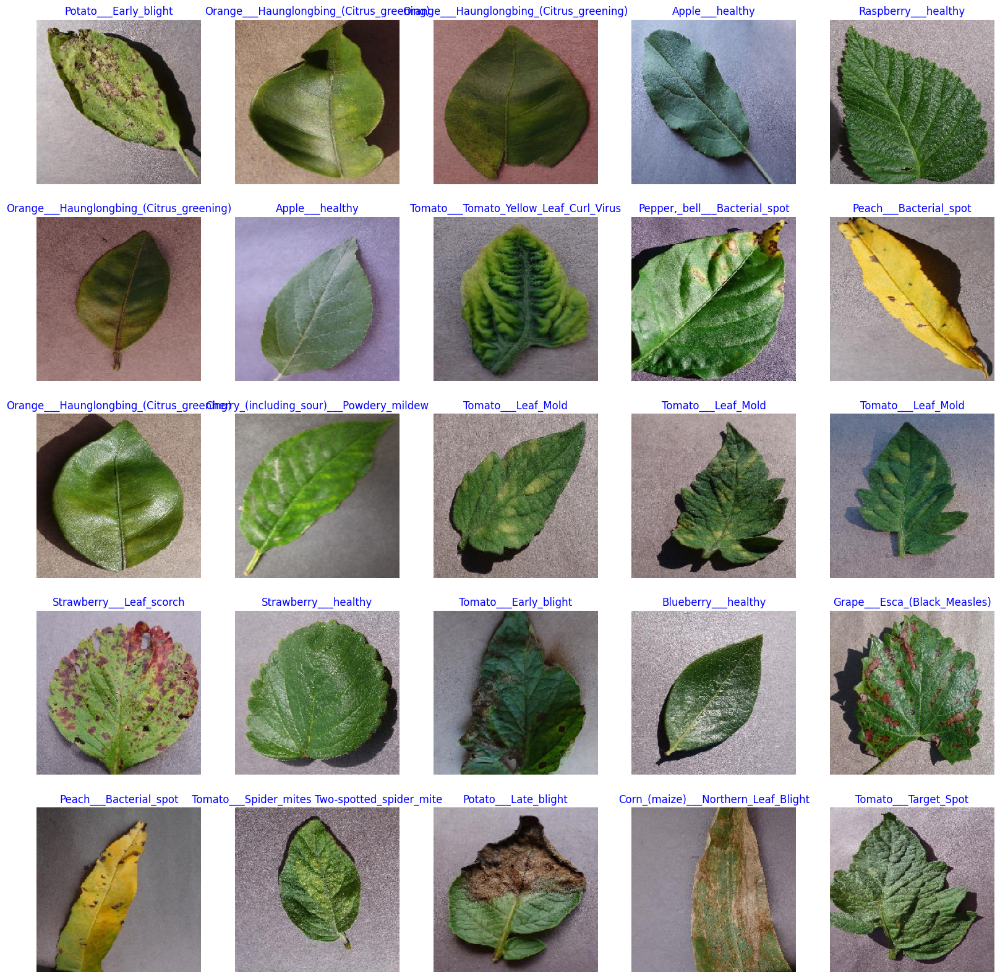

In [ ]:
show_images(train_gen)

# Implémentation de notre CNN

Une fois nos données prêtes et prétraitées, nous avons entamé la construction de l’architecture de notre réseau de neurones convolutif (CNN). Dans un premier temps, nous avons opté pour une architecture simple, sans ajustement approfondi des hyperparamètres, et sans earlystopping afin d’observer le comportement initial du modèle et poser une base pour les itérations futures.

## Architecture de notre CNN

L’architecture du réseau convolutif a été conçue de manière progressive en empilant quatre blocs de convolution, chacun suivi d’une normalisation par lots (BatchNormalization) et d’un MaxPooling pour réduire la dimensionnalité. Le nombre de filtres commence à 32 et double à chaque bloc (32 → 64 → 128 → 256) afin de permettre au modèle de capturer des caractéristiques de plus en plus complexes à mesure que la profondeur augmente. La taille des filtres (3x3) est un choix standard qui permet de détecter efficacement les motifs locaux tout en maintenant un coût de calcul raisonnable. La fonction d’activation ReLU est utilisée dans toutes les couches convolutionnelles pour introduire la non-linéarité tout en évitant le problème de vanishing gradient. À la fin, une couche Flatten transforme les cartes de caractéristiques en vecteur, suivi d’une couche dense de 128 neurones qui joue le rôle de classificateur intermédiaire. Enfin, une couche dense à 38 neurones avec softmax est utilisée en sortie pour la classification multiclasse, correspondant aux 38 classes du dataset PlantVillage. L’optimiseur Adam a été choisi pour sa rapidité de convergence et sa capacité à ajuster dynamiquement le taux d’apprentissage. Ce choix d’architecture permet d’obtenir un bon compromis entre complexité, expressivité du modèle et capacité de généralisation, tout en restant adapté à des images d’entrée de taille 224×224.

In [ ]:
model = Sequential()

# Bloc 1 : première couche de convolution avec 32 filtres, normalisation puis sous-échantillonnage
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)))  # entrée image 224x224 avec 3 canaux (RGB)
model.add(BatchNormalization())  # normalisation des activations pour accélérer l’apprentissage
model.add(MaxPooling2D(pool_size=(2, 2)))  # réduction de la dimension de l’image par sous-échantillonnage
#model.add(Dropout(0.25))

# Bloc 2 : deuxième couche de convolution avec 64 filtres
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))

# Bloc 3 : troisième couche de convolution avec 128 filtres
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))

# Bloc 4 : quatrième couche de convolution avec 256 filtres
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.3))

# Couche Fully Connected : aplatissement des features et classification
model.add(Flatten())  # transformation des matrices 2D en vecteur 1D
model.add(Dense(128, activation='relu'))  # couche dense avec 128 neurones
#model.add(Dropout(0.5))
model.add(Dense(38, activation='softmax'))  # couche de sortie avec 38 classes, softmax pour la classification multiclasses

# Compilation du modèle
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,422,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │         4,902 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,817,894 (26.01 MB)

 Trainable params: 6,816,934 (26.00 MB)

 Non-trainable params: 960 (3.75 KB)

## Entrainement de notre CNN

In [ ]:
# Entraînement avec 20 époques max
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=20,
)


Epoch 1/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 109s 102ms/step - accuracy: 0.3769 - loss: 3.0781 - val_accuracy: 0.5512 - val_loss: 2.0748
Epoch 2/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 93s 98ms/step - accuracy: 0.6636 - loss: 1.2082 - val_accuracy: 0.6832 - val_loss: 1.2064
Epoch 3/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 89s 94ms/step - accuracy: 0.7935 - loss: 0.6982 - val_accuracy: 0.5927 - val_loss: 2.1925
Epoch 4/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 95s 100ms/step - accuracy: 0.8524 - loss: 0.4856 - val_accuracy: 0.8367 - val_loss: 0.5683
Epoch 5/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 88s 92ms/step - accuracy: 0.8959 - loss: 0.3337 - val_accuracy: 0.7540 - val_loss: 1.0179
Epoch 6/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 98s 103ms/step - accuracy: 0.9336 - loss: 0.2200 - val_accuracy: 0.7811 - val_loss: 1.1762
Epoch 7/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 86s 90ms/step - accuracy: 0.9437 - loss: 0.1858 - val_accuracy: 0.8763 - val_loss: 0.5009
Epoch 8/20
951/951 ━━━━━━━━━━━━━━━━━━━━ 87s 91ms/step - accuracy: 0.9573 - loss: 0.132

## Courbes de la fonction de perte et de l'accuracy

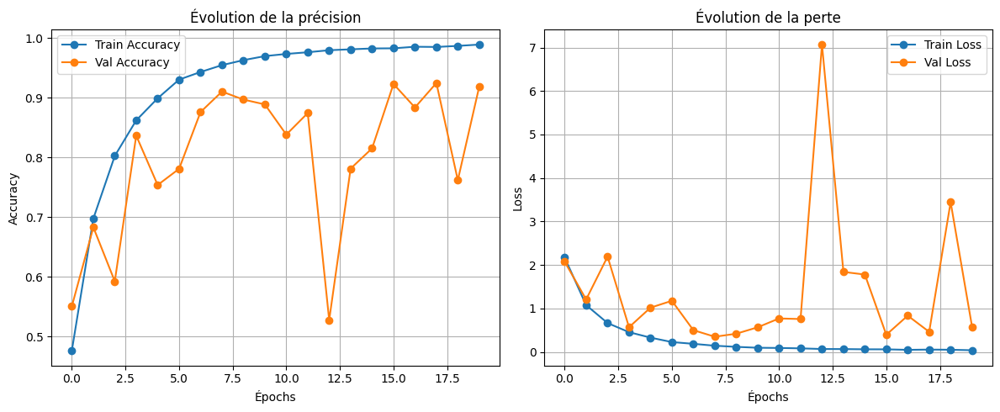

In [ ]:

# Accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
plt.title('Évolution de la précision')
plt.xlabel('Épochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title('Évolution de la perte')
plt.xlabel('Épochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


**Commentaires :**

**Surapprentissage (overfitting) marqué :**
Les courbes d'entraînement et de validation révèlent clairement un surapprentissage.

La précision sur les données d'entraînement progresse de manière constante jusqu'à frôler les 100 %, signe que le modèle s'ajuste parfaitement à ces données. En revanche, la précision sur le jeu de validation montre des fluctuations importantes d'une époque à l'autre : bien qu'elle atteigne parfois de bons scores (>90 %), elle chute brutalement à certains moments. Ce comportement est également visible dans la courbe de perte de validation, qui présente des pics élevés (notamment autour de l’époque 12), contrairement à la perte d'entraînement qui diminue régulièrement et reste faible.

**Conclusion :**
Ce modèle n'est pas encore satisfaisant. Les fortes variations sur les données de validation montrent qu’il généralise mal et risque donc de produire des performances peu fiables sur des données jamais vues. Des ajustements sont nécessaires pour améliorer sa robustesse, notamment via la régularisation, la réduction de la complexité du modèle ou l’intégration d’un mécanisme comme l’early stopping.

In [ ]:
model.save("modelCNN.h5")

#  Evaluation du modèle initial

## Construction de y_pred & y_true

In [30]:
# Classifiaction des images de test
y_score = model.predict(test_gen, verbose=1)


4073/4073 ━━━━━━━━━━━━━━━━━━━━ 30s 7ms/step


In [31]:
# Convertion des scores prédits (y_score) en classes prédites (y_pred)
y_pred = np.argmax(y_score, axis=1)


In [32]:
# Noms des classes
class_names = list(train_gen.class_indices.keys())
print(class_names)


['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [33]:


y_true = test_gen.classes  # Indice de la classe vraie pour chaque image du générateur test_gen
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))  #Transforme ces labels en représentation "one-hot"


In [ ]:
print(len(y_true), len(y_pred))  # doivent être identiques


8146 8146


## Rapport de classification (Accuracy,Recall, Précision, F1-score)

In [ ]:

# y_true = vraies étiquettes
# y_pred = prédictions du modèle
print(classification_report(y_true, y_pred, target_names=class_names))


                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.86      0.85      0.86        95
                                 Apple___Black_rot       0.78      0.94      0.85        93
                          Apple___Cedar_apple_rust       0.97      0.93      0.95        41
                                   Apple___healthy       0.73      0.96      0.83       247
                               Blueberry___healthy       0.95      1.00      0.97       226
          Cherry_(including_sour)___Powdery_mildew       0.99      0.93      0.96       158
                 Cherry_(including_sour)___healthy       0.73      1.00      0.84       128
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.88      0.79      0.84        77
                       Corn_(maize)___Common_rust_       0.99      0.99      0.99       179
               Corn_(maize)___Northern_Leaf_Blight       0.87      0.92      0.

## Matrice de confusion

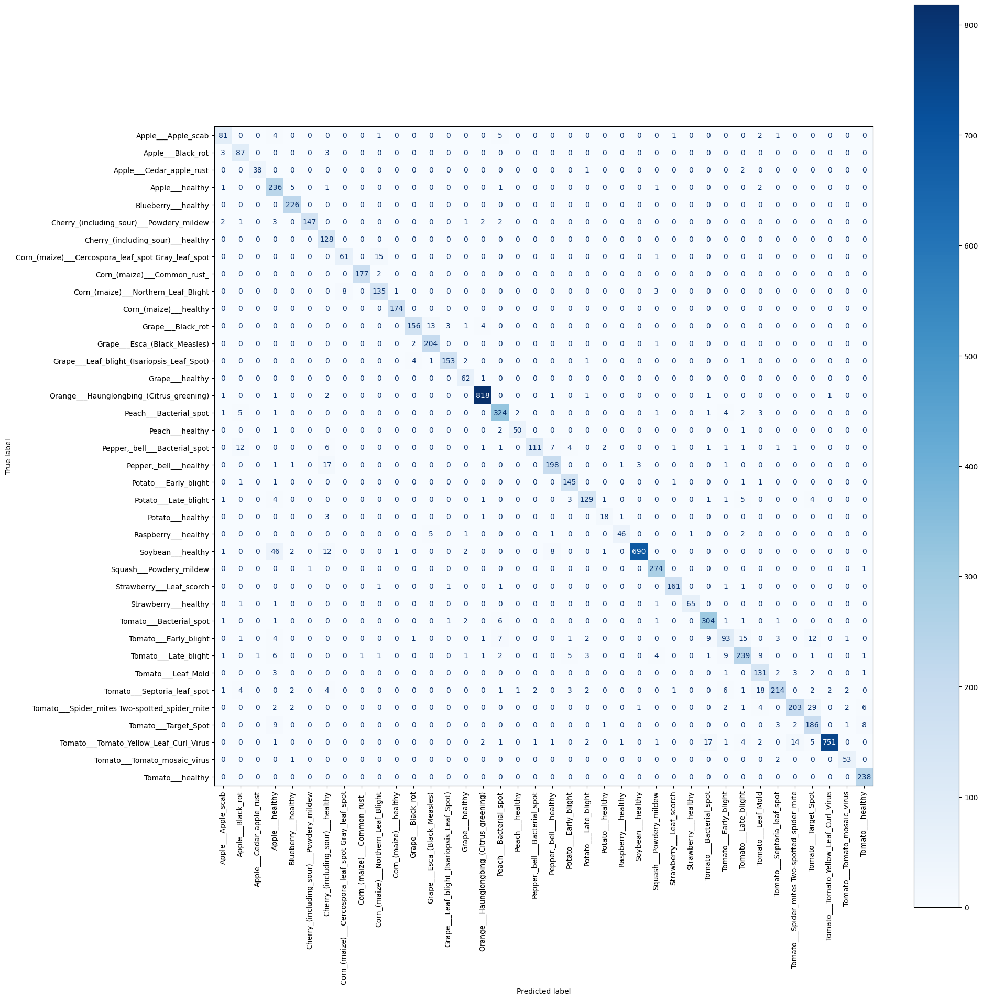

In [ ]:

# Génère la matrice de confusion
cm = confusion_matrix(y_true, y_pred)

# Affichage de la matrice avec une taille plus grande
fig, ax = plt.subplots(figsize=(20, 20))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation=90)  # Rotation des étiquettes en bas
plt.tight_layout()  # Ajuste automatiquement les espacements
plt.show()


## Courbe ROC

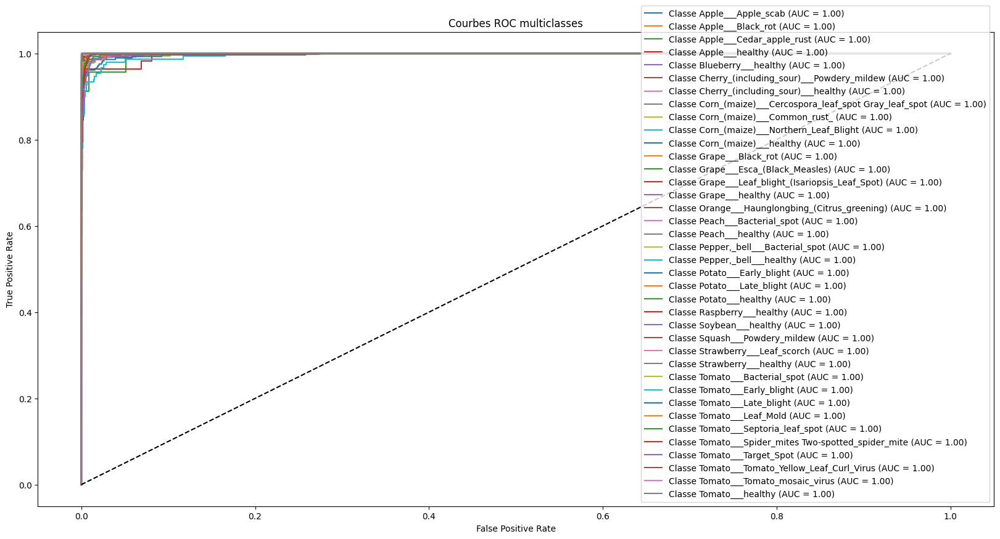

In [40]:
# Transformation des étiquettes vraies en one-hot encoding pour un problème multiclasses
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

# Récupération du nombre de classes à partir de la forme des étiquettes binarisées
n_classes = y_true_bin.shape[1]

plt.figure(figsize=(20, 10))

# Boucle sur chaque classe pour calculer et tracer la courbe ROC
for i in range(n_classes):
    # Calcul du TPR (taux de vrais positifs) et du FPR (taux de faux positifs) pour la classe i
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    # Calcul de l'AUC (aire sous la courbe) pour évaluer la qualité du modèle pour cette classe
    roc_auc = auc(fpr, tpr)
    # Tracé de la courbe ROC pour la classe i
    plt.plot(fpr, tpr, label=f"Classe {class_names[i]} (AUC = {roc_auc:.2f})")

# Tracé de la diagonale de référence (modèle aléatoire)
plt.plot([0, 1], [0, 1], 'k--')

# Personnalisation du graphique
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Courbes ROC multiclasses")
plt.legend(loc="lower right")
plt.show()


In [ ]:
X_test = []
y_true = []
for i in range(len(test_gen)):
    x_batch, y_batch = test_gen[i]
    X_test.extend(x_batch)
    y_true.extend(np.argmax(y_batch, axis=1))  # si y_batch est one-hot

X_test = np.array(X_test)
y_true = np.array(y_true)

## Visualisation de quelques prédictions

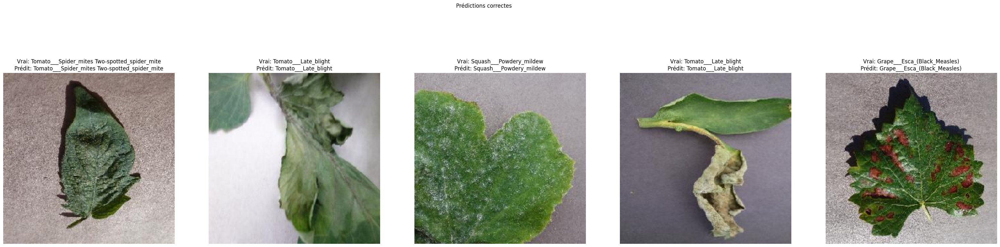

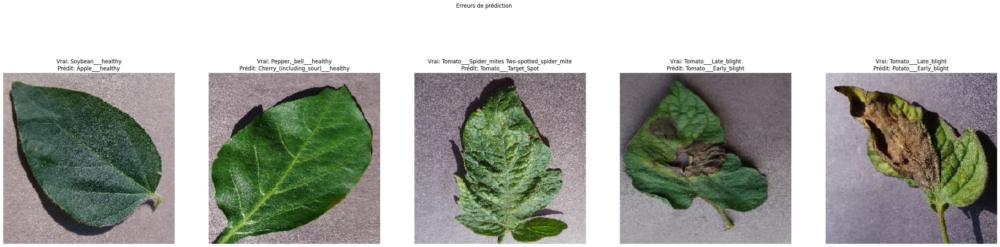

In [ ]:


correct_idx = np.where(y_pred == y_true)[0]
incorrect_idx = np.where(y_pred != y_true)[0]

# Montrer quelques prédictions correctes
plt.figure(figsize=(40, 10))
for i, idx in enumerate(correct_idx[:5]):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_test[idx].squeeze(), cmap='gray') 
    plt.title(f"Vrai: {class_names[y_true[idx]]}\nPrédit: {class_names[y_pred[idx]]}")
    plt.axis('off')
plt.suptitle("Prédictions correctes")
plt.show()

# Montrer quelques prédictions incorrectes
plt.figure(figsize=(40, 10))
for i, idx in enumerate(incorrect_idx[:5]):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_test[idx].squeeze(), cmap='gray')
    plt.title(f"Vrai: {class_names[y_true[idx]]}\nPrédit: {class_names[y_pred[idx]]}")
    plt.axis('off')
plt.suptitle("Erreurs de prédiction")
plt.show()


# Analyse des forces et faiblesses du modèle initial

Le modèle montre de très bonnes performances globales, avec une précision de 92 %. Il reconnaît bien la majorité des maladies, surtout celles pour lesquelles il a eu beaucoup d’exemples pendant l'entraînement. Par exemple, les maladies comme Tomato___Tomato_Yellow_Leaf_Curl_Virus ou Orange___Haunglongbing ont presque 100 % de bonnes prédictions.

**Cependant, Cette apparente excellente cache cependant un problème de fond : le surapprentissage.** En effet, comme on a pu le constater sur les courbes de perte et de précision précédentes, le modèle apprend trop bien les exemples vus à l'entraînement, au point qu’il a du mal à généraliser à de nouveaux cas différents.


Cela est clairement mis en évidence pour certaines maladies qui ont peu d'exemples ou qui se ressemblent beaucoup visuellement, comme Tomato___Early_blight ou Potato___healthy, où les résultats sont moins bons.

Pour éviter cela, nous allons mettre en place un modèle optimisé qui va permettre de palier à tous ces défauts.

# CNN OPTIMISE

Nous allons à présent mettre en œuvre une architecture CNN optimisée, conçue pour surmonter les limites du modèle initial. Cette nouvelle version intégrera un rééquilibrage des classes par augmentation de données, un prétraitement adapté des images, l'utilisation de l'early stopping pour prévenir le surapprentissage, ainsi qu'une optimisation des hyperparamètres et de la complexité du réseau.

## Appel de la fonction split_data définie plus haut pour spliter les données

In [9]:
data_dir = './data/plantvillage dataset/color/'

try:
    # Obtenir les données divisées
    train_df, valid_df, test_df = split_data(data_dir)


except:
    print('Entrée invalide')


## Calcul des poids de classes pour compenser le déséquilibre des données dans l'entraînement d'un modèle

In [10]:

# Obtenir les noms des classes
class_names = sorted(train_df['labels'].unique())
class_indices = {label: idx for idx, label in enumerate(class_names)}

# Convertir les étiquettes en indices numériques
train_df['label_idx'] = train_df['labels'].map(class_indices)

# Calcul des poids
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_idx']),
    y=train_df['label_idx']
)

class_weights_dict = dict(enumerate(class_weights))


## Prétraitement & Data Augmentation

Ce code définit une fonction `create_gens` qui crée des générateurs de données pour l'entraînement, la validation et les tests d'un modèle de classification d'images. Il inclut de l'augmentation des données (data augmentation) pour le générateur d'entraînement afin d'améliorer la diversité des images et lutter contre le surapprentissage. Cette augmentation comprend des transformations telles que la rotation, le décalage de position, le zoom et l'ajustement de la luminosité. Pour la validation et le test, des générateurs sans augmentation sont utilisés. Le code normalise également les images en les divisant par 255 pour les mettre à l'échelle entre 0 et 1. Enfin, il gère le déséquilibre des classes en calculant un batch size pour le générateur de test adapté à la taille de l'ensemble de données. Ces générateurs sont ensuite créés à partir des dataframes d'entrées contenant les chemins des fichiers et les étiquettes des images.

In [11]:


def create_gens(train_df, valid_df, test_df, batch_size):
    '''
    Crée les générateurs pour entraînement, validation et test.
    Inclut de la data augmentation pour l'entraînement et gère le déséquilibre via class_weight.
    '''
    img_size = (224, 224)
    channels = 3
    color = 'rgb'
    ts_length = len(test_df)
    test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length % n == 0 and ts_length / n <= 80]))


    def scalar(img):
      return img / 255.0  # Normalisation


    # Data Augmentation pour le train
    tr_gen = ImageDataGenerator(
        preprocessing_function=scalar,
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        brightness_range=[0.8, 1.2],
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Validation et test sans augmentation
    ts_gen = ImageDataGenerator(preprocessing_function=scalar)

    # Générateurs
    train_gen = tr_gen.flow_from_dataframe(
        train_df, x_col='filepaths', y_col='labels',
        target_size=img_size, class_mode='categorical',
        color_mode=color, shuffle=True, batch_size=batch_size)

    valid_gen = ts_gen.flow_from_dataframe(
        valid_df, x_col='filepaths', y_col='labels',
        target_size=img_size, class_mode='categorical',
        color_mode=color, shuffle=True, batch_size=batch_size)

    test_gen = ts_gen.flow_from_dataframe(
        test_df, x_col='filepaths', y_col='labels',
        target_size=img_size, class_mode='categorical',
        color_mode=color, shuffle=False, batch_size=test_batch_size)

    return train_gen, valid_gen, test_gen


## Appel de la fonction create_gens

In [12]:
train_gen, valid_gen, test_gen = create_gens(train_df, valid_df, test_df, batch_size=32)



Found 38013 validated image filenames belonging to 38 classes.
Found 8146 validated image filenames belonging to 38 classes.
Found 8146 validated image filenames belonging to 38 classes.


## Architcture du modèle CNN optimisé

L’architecture CNN optimisée se distingue de la version initiale par une complexité légèrement accrue : elle intègre un cinquième bloc de convolution, adopte l’optimiseur RMSprop à la place de celui utilisé auparavant, et utilise 256 neurones dans la couche dense qui suit l’aplatissement (flatten).

In [14]:

modelOPT = Sequential()

# Bloc 1
modelOPT.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)))
modelOPT.add(BatchNormalization())
modelOPT.add(MaxPooling2D(pool_size=(2, 2)))
modelOPT.add(Dropout(0.25))

# Bloc 2
modelOPT.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
modelOPT.add(BatchNormalization())
modelOPT.add(MaxPooling2D(pool_size=(2, 2)))
modelOPT.add(Dropout(0.25))

# Bloc 3
modelOPT.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
modelOPT.add(BatchNormalization())
modelOPT.add(MaxPooling2D(pool_size=(2, 2)))
modelOPT.add(Dropout(0.25))

# Bloc 4
modelOPT.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
modelOPT.add(BatchNormalization())
modelOPT.add(MaxPooling2D(pool_size=(2, 2)))
modelOPT.add(Dropout(0.3))

# Bloc 5
modelOPT.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
modelOPT.add(BatchNormalization())
modelOPT.add(MaxPooling2D(pool_size=(2, 2)))
modelOPT.add(Dropout(0.4))


# Couche Fully Connected
modelOPT.add(Flatten())
modelOPT.add(Dense(256, activation='relu'))
modelOPT.add(Dropout(0.5))
modelOPT.add(Dense(38, activation='softmax'))  # 38 classes

# Compilation
modelOPT.compile(optimizer=RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

modelOPT.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 8,005,094 (30.54 MB)

 Trainable params: 8,003,110 (30.53 MB)

 Non-trainable params: 1,984 (7.75 KB)

##  Callbacks

Ce code configure plusieurs paramètres pour entraîner un modèle de manière efficace et avec des stratégies pour éviter le sur-apprentissage et améliorer la convergence. D'abord, il définit des paramètres comme la taille des lots (batch_size), le nombre d'époques (epochs), et les paramètres relatifs à la gestion du taux d'apprentissage et de l'arrêt précoce.

Le callback EarlyStopping est utilisé pour surveiller la perte de validation (val_loss) et arrêter l'entraînement si la perte ne s'améliore pas pendant un nombre spécifié d'époques, tout en restaurant les meilleurs poids obtenus au cours de l'entraînement. Le callback ReduceLROnPlateau permet de réduire dynamiquement le taux d'apprentissage si la perte de validation ne s'améliore pas, ce qui aide à explorer plus finement les minima locaux.

Finalement, les deux callbacks EarlyStopping et ReduceLROnPlateau sont inclus dans la liste des callbacks qui seront utilisés pendant l'entraînement, afin d'optimiser le processus en ajustant le taux d'apprentissage ou en arrêtant l'entraînement de manière automatique si nécessaire.

In [15]:
# Définition des paramètres d'entraînement
batch_size = 40  # Taille du lot pour chaque itération d'entraînement
epochs = 30  # Nombre total d'époques d'entraînement
patience = 1  # Nombre d'époques sans amélioration avant d'ajuster le taux d'apprentissage
stop_patience = 3  # Nombre d'époques sans amélioration avant d'arrêter l'entraînement
threshold = 0.9  # Seuil pour considérer une prédiction comme correcte
factor = 0.5  # Facteur pour réduire le taux d'apprentissage
ask_epoch = 5  # Nombre d'époques après lesquelles on peut demander si l'utilisateur souhaite arrêter l'entraînement
batches = int(np.ceil(len(train_gen.labels) / batch_size))  # Calcul du nombre total de lots (batches) d'entraînement

# Callback pour arrêter l'entraînement si la performance sur la validation ne s'améliore pas
early_stop = EarlyStopping(monitor='val_loss', patience=stop_patience, restore_best_weights=True)

# Callback pour réduire le taux d'apprentissage si la performance de la validation ne s'améliore pas
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Surveille la perte de validation
    factor=factor,  # Réduit le taux d'apprentissage par un facteur donné
    patience=patience,  # Nombre d'époques avant de réduire le taux d'apprentissage
    verbose=1  # Affiche un message lorsqu'une réduction du taux d'apprentissage se produit
)

"""def ask_to_stop(epoch, logs):

Cette fonction propose une fonctionnalité permettant à l'utilisateur de décider manuellement s'il souhaite arrêter l'entraînement après un certain nombre d'époques, ce qui pourrait être utile pour surveiller l'entraînement en temps réel.
    if (epoch + 1) == ask_epoch:
        ans = input(f"\nVoulez-vous arrêter l'entraînement à l'epoch {epoch+1} ? (y/n): ")
        if ans.lower() == 'y':
            modelOPT.stop_training = True

ask_callback = LambdaCallback(on_epoch_end=ask_to_stop)"""

# Liste des callbacks à utiliser pendant l'entraînement
callbacks = [early_stop, reduce_lr]  # Ajoute les callbacks d'arrêt précoce et de réduction du taux d'apprentissage


## Entrainement du modèle

In [16]:
history = modelOPT.fit(x= train_gen, epochs= epochs, verbose= 1, callbacks= callbacks,validation_data= valid_gen)

Epoch 1/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 563s 461ms/step - accuracy: 0.1612 - loss: 5.0779 - val_accuracy: 0.1268 - val_loss: 8.0548 - learning_rate: 0.0010
Epoch 2/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 515s 434ms/step - accuracy: 0.2396 - loss: 3.0277 - val_accuracy: 0.2455 - val_loss: 3.7289 - learning_rate: 0.0010
Epoch 3/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 532s 448ms/step - accuracy: 0.2518 - loss: 2.9444 - val_accuracy: 0.2551 - val_loss: 2.9131 - learning_rate: 0.0010
Epoch 4/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - accuracy: 0.2701 - loss: 2.8940
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 517s 435ms/step - accuracy: 0.2701 - loss: 2.8940 - val_accuracy: 0.3279 - val_loss: 4.9888 - learning_rate: 0.0010
Epoch 5/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 517s 435ms/step - accuracy: 0.3129 - loss: 2.7339 - val_accuracy: 0.3424 - val_loss: 2.6226 - learning_rate: 5.0000e-04
Epoch 6/30
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 512s 431m

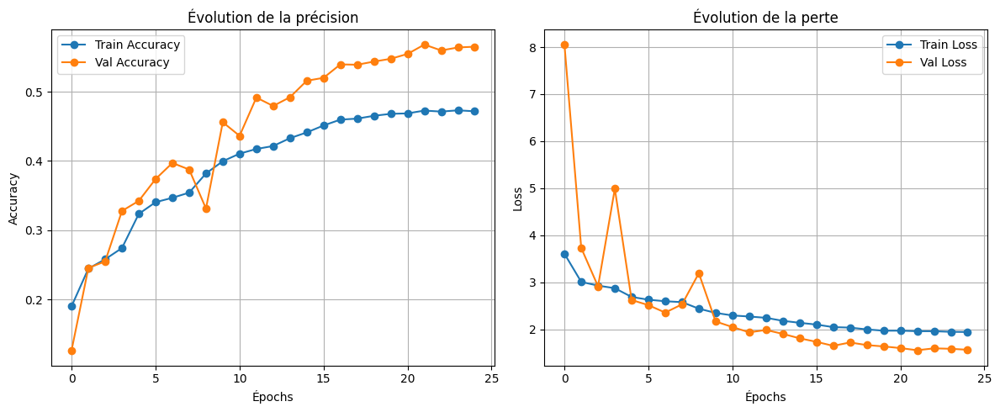

In [17]:

# Accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
plt.title('Évolution de la précision')
plt.xlabel('Épochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title('Évolution de la perte')
plt.xlabel('Épochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


Comparé au modèle initial, cette version optimisée montre nettement moins de surapprentissage. Les courbes de validation sont plus stables : la courbe de perte en validation reste légèrement en dessous de celle d'entraînement, tandis que la courbe de précision est largement supérieure à celle observée en entraînement. Ces éléments traduisent une meilleure capacité de généralisation du modèle.

De plus, la courbe de perte en validation montre quelques instabilités initiales, mais tend à diminuer progressivement avant de se stabiliser.
De même, la précision en validation augmente de façon régulière au fil des époques.

En conclusion, sur le plan de l'apprentissage, le comportement du modèle montre une nette amélioration par rapport à la version précédente.

In [18]:
modelOPT.save("modelCNNOPT.h5")

## Evaluation du modèle optimisé

In [19]:
# Classifiaction des images de test
y_score = modelOPT.predict(test_gen, verbose=1)

# Convertion des scores prédits (y_score) en classes prédites (y_pred)
y_pred = np.argmax(y_score, axis=1)

# Noms des classes
class_names = list(train_gen.class_indices.keys())


y_true = test_gen.classes  # Indice de la classe vraie pour chaque image du générateur test_gen
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))  #Transforme ces labels en représentation "one-hot"




4073/4073 ━━━━━━━━━━━━━━━━━━━━ 21s 5ms/step


### Rapport de classification

In [20]:
# y_true = vraies étiquettes
# y_pred = prédictions du modèle
print(classification_report(y_true, y_pred, target_names=class_names))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.67      0.02      0.04        95
                                 Apple___Black_rot       0.00      0.00      0.00        93
                          Apple___Cedar_apple_rust       0.00      0.00      0.00        41
                                   Apple___healthy       0.60      0.72      0.66       247
                               Blueberry___healthy       0.00      0.00      0.00       226
          Cherry_(including_sour)___Powdery_mildew       0.00      0.00      0.00       158
                 Cherry_(including_sour)___healthy       0.00      0.00      0.00       128
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.59      0.94      0.72        77
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       179
               Corn_(maize)___Northern_Leaf_Blight       0.96      0.65      0.

### Matrice de confusion

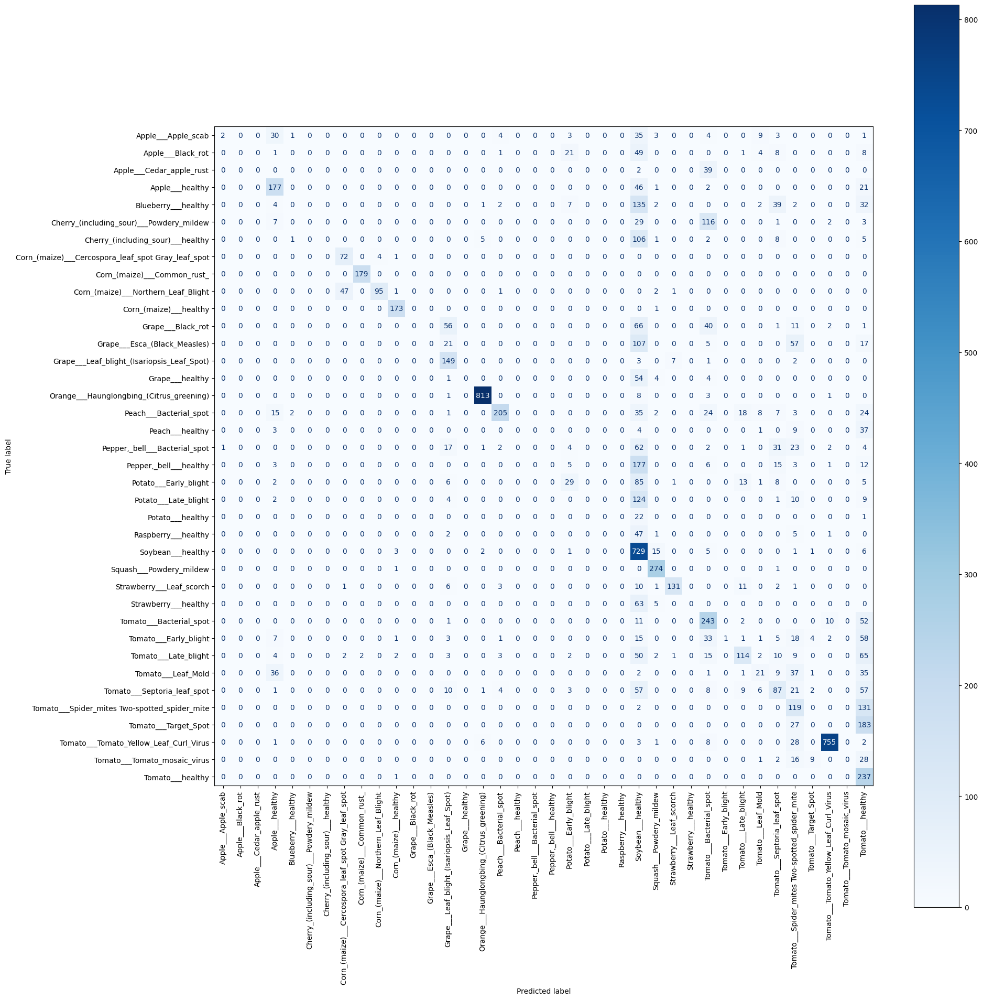

In [21]:
# Génère la matrice de confusion
cm = confusion_matrix(y_true, y_pred)

# Affichage de la matrice avec une taille plus grande
fig, ax = plt.subplots(figsize=(20, 20))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation=90)  # Rotation des étiquettes en bas
plt.tight_layout()  # Ajuste automatiquement les espacements
plt.show()



### Courbe ROC

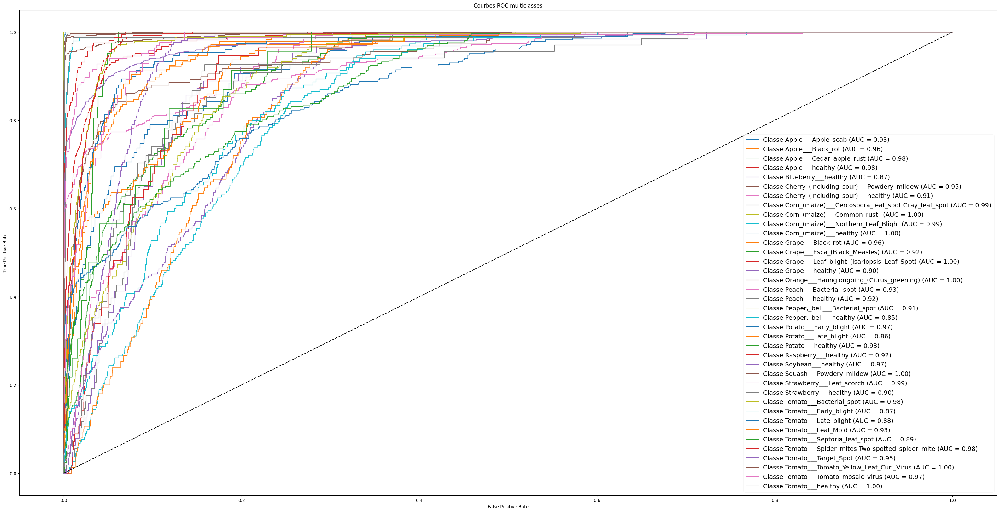

In [22]:
# Transformation des étiquettes vraies en one-hot encoding pour un problème multiclasses
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

# Récupération du nombre de classes à partir de la forme des étiquettes binarisées
n_classes = y_true_bin.shape[1]

plt.figure(figsize=(40, 20))

# Boucle sur chaque classe pour calculer et tracer la courbe ROC
for i in range(n_classes):
    # Calcul du TPR (taux de vrais positifs) et du FPR (taux de faux positifs) pour la classe i
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    # Calcul de l'AUC (aire sous la courbe) pour évaluer la qualité du modèle pour cette classe
    roc_auc = auc(fpr, tpr)
    # Tracé de la courbe ROC pour la classe i
    plt.plot(fpr, tpr, label=f"Classe {class_names[i]} (AUC = {roc_auc:.2f})")

# Tracé de la diagonale de référence (modèle aléatoire)
plt.plot([0, 1], [0, 1], 'k--')

# Personnalisation du graphique
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Courbes ROC multiclasses")
plt.legend(loc="lower right", fontsize=14)
plt.show()


### Visualisation de quelques prédictions en image

In [23]:
X_test = []
y_true = []
for i in range(len(test_gen)):
    x_batch, y_batch = test_gen[i]
    X_test.extend(x_batch)
    y_true.extend(np.argmax(y_batch, axis=1))  # si y_batch est one-hot

X_test = np.array(X_test)
y_true = np.array(y_true)

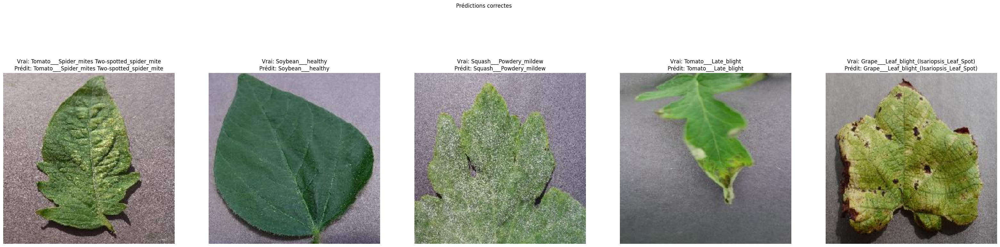

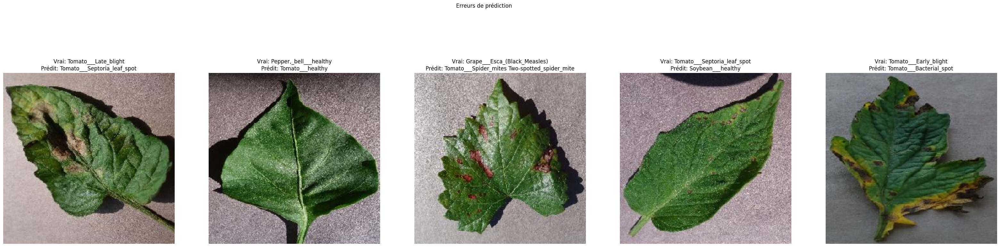

In [ ]:


correct_idx = np.where(y_pred == y_true)[0]
incorrect_idx = np.where(y_pred != y_true)[0]

# Montrer quelques prédictions correctes
plt.figure(figsize=(40, 10))
for i, idx in enumerate(correct_idx[:5]):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_test[idx].squeeze(), cmap='gray')  
    plt.title(f"Vrai: {class_names[y_true[idx]]}\nPrédit: {class_names[y_pred[idx]]}")
    plt.axis('off')
plt.suptitle("Prédictions correctes")
plt.show()

# Montrer quelques prédictions incorrectes
plt.figure(figsize=(40, 10))
for i, idx in enumerate(incorrect_idx[:5]):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_test[idx].squeeze(), cmap='gray')
    plt.title(f"Vrai: {class_names[y_true[idx]]}\nPrédit: {class_names[y_pred[idx]]}")
    plt.axis('off')
plt.suptitle("Erreurs de prédiction")
plt.show()


## Comparaison des performances avant/après optimisation

Comparé au modèle initial, notre version optimisée apprend de manière plus équilibrée, sans présenter de surapprentissage marqué. Toutefois, l’analyse du rapport de classification révèle des performances très faibles sur les classes minoritaires, avec une précision et un rappel quasiment nuls. Cela s'explique par une performance globale limitée, le modèle atteignant une précision de seulement 57 % sur les données de test. En revanche, les classes majoritaires sont correctement prédites.

En conclusion, bien que le surapprentissage soit réduit, ce modèle n’offre pas encore des performances satisfaisantes, notamment en termes de généralisation aux classes sous-représentées.

# Conclusion et perspectives

Malgré les améliorations apportées à notre modèle, ses performances demeurent limitées. Pour aller plus loin, il serait pertinent d’envisager, dans les étapes futures, un *fine-tuning* à partir d’un modèle pré-entraîné adapté à notre jeu de données, ou encore de suffisamment élargir la base d’images afin de permettre une montée en complexité du modèle.